In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

\begin{equation*}
    \begin{dcases}
        \frac{dS}{dt}=-\frac{\beta IS}{N}\\\\
        \frac{dI}{dt}=\frac{\beta IS}{N}-\gamma I\\\\
        \frac{dR}{dt}=\gamma I
    \end{dcases}
\end{equation*}

In [2]:
def SIR(y,t,b,N,g):
    S,I,R=y
    dS=-(b*I*S)/N
    dI=(b*I*S)/N-g*I
    dR=g*I
    return dS,dI,dR

In [3]:
N=1000
R0=0
I0=3
S0=N-I0-R0
y0=S0,I0,R0
t=np.linspace(0,200,201)
b=0.4
g=0.04

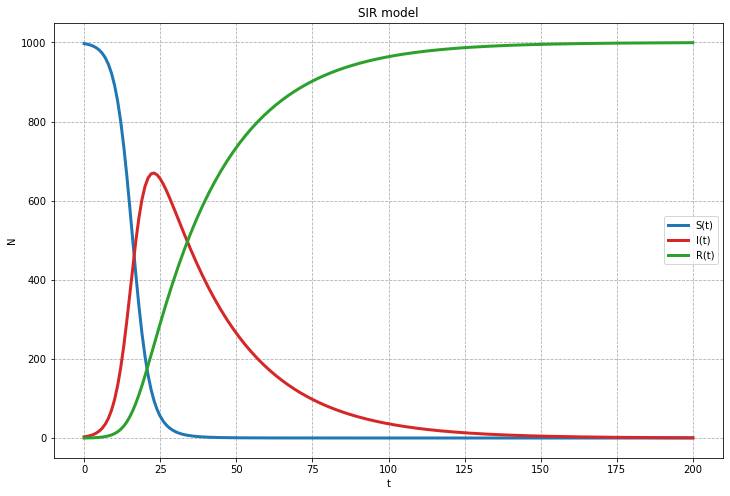

In [4]:
y=odeint(SIR,y0,t,(b,N,g))
plt.figure(figsize=(12,8))
plt.plot(t,y[:,0],"C0",label="S(t)",lw=3)
plt.plot(t,y[:,1],"C3",label="I(t)",lw=3)
plt.plot(t,y[:,2],"C2",label="R(t)",lw=3)
plt.title("SIR model")
plt.xlabel("t")
plt.ylabel("N")
plt.grid(linestyle='--')
plt.legend()

In [5]:
fig=plt.figure(figsize=(12,8))
fig.set_tight_layout(True)
plt.title("SIR model")
ax1=plt.subplot(221)
line1,=ax1.plot([],[],"C0",lw=3)
point1,=ax1.plot([],[],"C0o",lw=3)
ax1.set_xlim(-10,210)
ax1.set_ylim(-50,1050)
ax1.set_title("S(t)")
ax1.set_xlabel("t")
ax1.set_ylabel("N")
ax1.grid(linestyle='--')
ax2=plt.subplot(212)
line2,=ax2.plot([],[],"C3",lw=3)
point2,=ax2.plot([],[],"C3o",lw=3)
ax2.set_xlim(-10,210)
ax2.set_ylim(-50,1050)
ax2.set_title("I(t)")
ax2.set_xlabel("t")
ax2.set_ylabel("N")
ax2.grid(linestyle='--')
ax3=plt.subplot(222)
line3,=ax3.plot([],[],"C2",lw=3)
point3,=ax3.plot([],[],"C2o",lw=3)
ax3.set_xlim(-10,210)
ax3.set_ylim(-50,1050)
ax3.set_title("R(t)")
ax3.set_xlabel("t")
ax2.set_ylabel("N")
ax3.grid(linestyle='--')
plt.close()
fig.set_facecolor("white")
fig.suptitle("SIR model")

def animate(i):
    line1.set_data(t[:i],y[:i,0])
    point1.set_data(t[i],y[i,0])
    line2.set_data(t[:i],y[:i,1])
    point2.set_data(t[i],y[i,1])
    line3.set_data(t[:i],y[:i,2])
    point3.set_data(t[i],y[i,2])
    return line1,point1,line2,point2,line3,point3

anim=FuncAnimation(fig,animate,len(t),interval=40,blit=True)
HTML(anim.to_jshtml())